In [2]:
from pathlib import Path
from sentence_transformers import SentenceTransformer
import numpy as np
import torch
import json
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

from IPython.display import display
from PIL import Image
import decord
from einops import rearrange

np.set_printoptions(suppress=True)

/data/gunsbrother/anaconda3/envs/sbert3/lib/python3.12/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm, trange


In [3]:
# model = SentenceTransformer('multi-qa-mpnet-base-dot-v1')
model = SentenceTransformer('all-mpnet-base-v2').eval()
model2 = SentenceTransformer('/data/gunsbrother/prjs/ltvu/everything/results/all-mpnet-base-v2/checkpoint-200').eval()
model, model2

(SentenceTransformer(
   (0): Transformer({'max_seq_length': 384, 'do_lower_case': False}) with Transformer model: MPNetModel 
   (1): Pooling({'word_embedding_dimension': 768, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
   (2): Normalize()
 ),
 SentenceTransformer(
   (0): Transformer({'max_seq_length': 384, 'do_lower_case': False}) with Transformer model: MPNetModel 
   (1): Pooling({'word_embedding_dimension': 768, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
   (2): Normalize()
 ))

In [54]:
# clip_uid = '0a0e800f-7d2c-4464-996c-47cd2f323350'
np.random.seed(0)
p_nlq_val_json = Path('/data/gunsbrother/prjs/ltvu/llms/GroundVQA/data/unified/annotations.NLQ_val.json')
nlq_val_data = json.load(p_nlq_val_json.open())
clip_uids = set(entry['video_id'] for entry in nlq_val_data)
clip_uids = np.random.permutation(sorted(clip_uids))

In [ ]:
clip_uid = clip_uids[15]
questions, gts = [], []
for entry in nlq_val_data:
	if entry['video_id'] == clip_uid:
		questions.append(entry['question'])
		gts.append((entry['clip_start_sec'], entry['clip_end_sec']))
gts = np.array(gts)

print(f'Clip UID: {clip_uid}')

p_caps_dir = Path('/data/gunsbrother/prjs/ltvu/llms/LLaVA/results/egonlq/llava-v1.6-34b/global')
p_cap = p_caps_dir / f'{clip_uid}.json'
cap_data = json.load(p_cap.open())['answers']
caps = [cap[-1] for cap in cap_data]

Clip UID: 5e59031d-0deb-4557-a3e1-ba0ba2bb5465


In [131]:
z_caps = model.encode(caps)
z_qs = model.encode(questions, prompt='query: ')

z_caps2 = model2.encode(caps)
z_qs2 = model2.encode(questions, prompt='query: ')

z_caps.shape, z_qs.shape

((121, 768), (35, 768))

In [132]:
cap_stride_frame, fps = 300, 30
gt_idxs = np.clip(np.round(gts.mean(axis=1) * fps / cap_stride_frame).astype(int), 0, len(caps) - 1)
gt_idxs

array([  2,   2,   5,  18,  18,  18,  18,  21,  21,  23,  27,  60, 103,
       105, 107, 112, 113, 114, 116, 118,   2,  12,  17,  23,  28,  39,
        54,  56,  60,  77,  90, 103, 107, 114, 115])

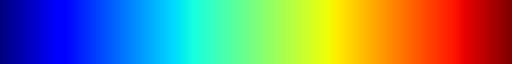

In [133]:
plt.get_cmap('jet')

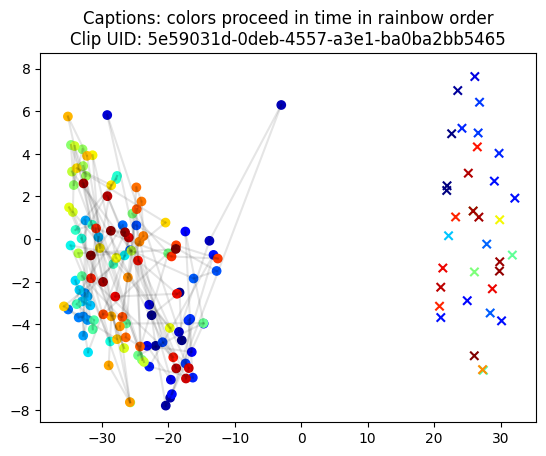

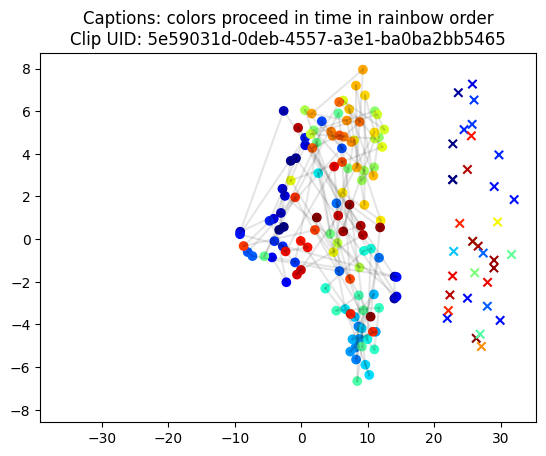

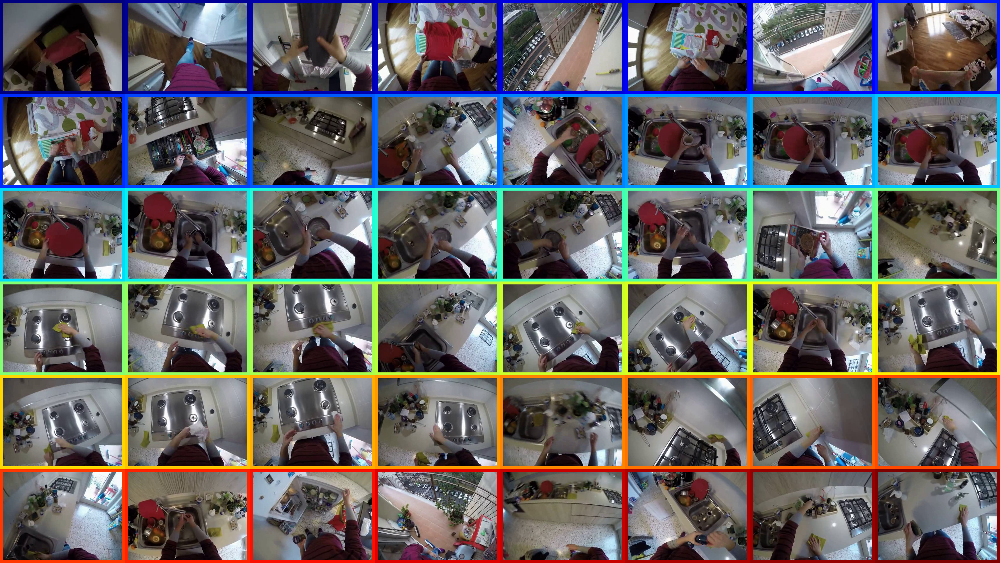

In [134]:
tsne = TSNE(n_components=2, random_state=0, perplexity=30, metric='cosine')

def compute_tsne(*datas):
	lengths = [len(data) for data in datas]
	data_ = np.concatenate(datas, axis=0)
	Y = tsne.fit_transform(data_)
	return np.split(Y, np.cumsum(lengths)[:-1], axis=0)

def plot_tsne(Y1, Y2=None, labels=None, title=None, xlim=None, ylim=None):
	# labels: list of labels(0, 1, 2, ...)
	if labels is None:
		labels = [0] * len(Y1)
	# if data2 is None:
	# 	Y = tsne.fit_transform(data)
	# else:
	# 	data_ = np.concatenate([data, data2], axis=0)
	# 	Y = tsne.fit_transform(data_)

	# l, l2 = len(Y1), len(Y2)
	l = len(Y1)
	plt.scatter(Y1[:, 0], Y1[:, 1], c=labels[:l], cmap='jet')
	if Y2 is not None:  # queries
		plt.scatter(Y2[:, 0], Y2[:, 1], c=labels[l:], marker='x', cmap='jet')
	for i in range(l-1):
		plt.plot(Y1[i:i+2, 0], Y1[i:i+2, 1], 'k-', alpha=0.1)
	if title:
		plt.title(title)
	if xlim is not None:
		plt.xlim(xlim)
	if ylim is not None:
		plt.ylim(ylim)
	plt.show()

def show_frames(clip_uid):
	p_clip = Path('/data/datasets/ego4d_data/v2/clips_320p-non_official/') / f'{clip_uid}.mp4'
	vr = decord.VideoReader(str(p_clip))
	num_frames = 48
	border = 10
	border_colors = plt.get_cmap('jet')(np.linspace(0, 1, num_frames))
	midframe = vr[len(vr)//num_frames//2::len(vr)//num_frames].asnumpy()
	for i, frame in enumerate(midframe):
		frame[:border] = border_colors[i][:3] * 255
		frame[-border:] = border_colors[i][:3] * 255
		frame[:, :border] = border_colors[i][:3] * 255
		frame[:, -border:] = border_colors[i][:3] * 255
	midframe = rearrange(midframe, '(th tw) h w c -> (th h) (tw w) c', tw=8)
	display(Image.fromarray(midframe))


# plot_tsne(
# 	z_caps, Y2=z_qs,
# 	labels=np.arange(z_caps.shape[0]).tolist()+gt_idxs.tolist(),
# 	title='Captions: colors proceed in time in rainbow order\n' + f'Clip UID: {clip_uid}'
# )
# plot_tsne(
# 	z_caps2, Y2=z_qs2,
# 	labels=np.arange(z_caps.shape[0]).tolist()+gt_idxs.tolist(),
# 	title='Captions: colors proceed in time in rainbow order\n' + f'Clip UID: {clip_uid}'
# )
y11, y12, y21, y22 = compute_tsne(z_caps, z_qs, z_caps2, z_qs2)
ys = 1.1*np.concatenate([y11, y12, y21, y22], axis=0)
xlims = [ys[:, 0].min(), ys[:, 0].max()]
ylims = [ys[:, 1].min(), ys[:, 1].max()]
plot_tsne(
	y11, y12, xlim=xlims, ylim=ylims,
	labels=np.arange(z_caps.shape[0]).tolist()+gt_idxs.tolist(),
	title='Captions: colors proceed in time in rainbow order\n' + f'Clip UID: {clip_uid}'
)
plot_tsne(
	y21, y22, xlim=xlims, ylim=ylims,
	labels=np.arange(z_caps.shape[0]).tolist()+gt_idxs.tolist(),
	title='Captions: colors proceed in time in rainbow order\n' + f'Clip UID: {clip_uid}'
)
show_frames(clip_uid)